In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
json_file = "drive/MyDrive/Traffic-flow-estimation-data/train/dataset.json"
image_root = "drive/MyDrive/Traffic-flow-estimation-data/train"

In [83]:
!pip install pyyaml==5.1

import torch
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
# Install detectron2 that matches the above pytorch version
# See https://detectron2.readthedocs.io/tutorials/install.html for instructions
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/$CUDA_VERSION/torch$TORCH_VERSION/index.html

     |████████████████████████████████| 274 kB 6.7 MB/s 
  Created wheel for pyyaml: filename=PyYAML-5.1-cp37-cp37m-linux_x86_64.whl size=44092 sha256=57a27c30cf6c24e1d85086c73ecfa0912290d8282b3fe2ff4365b9c442650ca8
  Stored in directory: /root/.cache/pip/wheels/77/f5/10/d00a2bd30928b972790053b5de0c703ca87324f3fead0f2fd9
Successfully built pyyaml
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 6.0
    Uninstalling PyYAML-6.0:
      Successfully uninstalled PyYAML-6.0


torch:  1.11 ; cuda:  cu113
Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu113/torch1.11/index.html


In [4]:
!pip install detectron2==0.1.3 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.5/index.html


Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.5/index.html


In [11]:
!pip install -U torch==1.5 torchvision==0.6 -f https://download.pytorch.org/whl/cu101/torch_stable.html
!pip install cython pyyaml==5.1
!pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
!gcc --version
# install detectron2:
!pip install detectron2==0.1.3 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.5/index.html

Looking in links: https://download.pytorch.org/whl/cu101/torch_stable.html
  Cloning https://github.com/cocodataset/cocoapi.git to /tmp/pip-req-build-2zudepks
  Running command git clone -q https://github.com/cocodataset/cocoapi.git /tmp/pip-req-build-2zudepks
1.5.0+cu101 False
gcc (Ubuntu 7.5.0-3ubuntu1~18.04) 7.5.0
Copyright (C) 2017 Free Software Foundation, Inc.
This is free software; see the source for copying conditions.  There is NO
warranty; not even for MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.

Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.5/index.html


In [1]:
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import cv2
import random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog

import contextlib
import datetime
import io
import json
import logging
import numpy as np
import os
import shutil
import pycocotools.mask as mask_util
from fvcore.common.timer import Timer
from iopath.common.file_io import file_lock
from PIL import Image

from detectron2.structures import Boxes, BoxMode, PolygonMasks, RotatedBoxes
from detectron2.utils.file_io import PathManager


In [32]:
DatasetCatalog.clear()
MetadataCatalog.clear()
import json
from detectron2.structures import BoxMode
def get_board_dicts(imgdir):
    json_file = imgdir+"/dataset.json" #Fetch the json file
    # with open(json_file) as f:
    #     dataset_dicts = json.load(f)
        # print(dataset_dicts)
    for i in dataset_dicts:
        filename = i["file_name"] 
        i["file_name"] = filename 
        for j in i["annotations"]:
            j["bbox_mode"] = BoxMode.XYWH_ABS #Setting the required Box Mode
            j["category_id"] = int(j["category_id"]%6)
    return dataset_dicts
from detectron2.data import DatasetCatalog, MetadataCatalog
#Registering the Dataset
for d in ["train", "val"]:
    DatasetCatalog.register("boardetect_" + d, lambda d=d: get_board_dicts("drive/MyDrive/Traffic-flow-estimation-data/" + d))
    MetadataCatalog.get("boardetect_" + d).set(thing_classes=["bus","car","tram", "trolleybus","truck","van"])
board_metadata = MetadataCatalog.get("boardetect_train")

[[[ 7  7  7]
  [ 8  8  8]
  [ 8  8  8]
  ...
  [ 3  3  1]
  [ 3  3  1]
  [ 3  3  1]]

 [[ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]
  ...
  [ 3  3  1]
  [ 3  3  1]
  [ 3  3  1]]

 [[ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]
  ...
  [ 3  3  1]
  [ 3  3  1]
  [ 3  3  1]]

 ...

 [[ 3  2  0]
  [ 3  2  0]
  [ 3  2  0]
  ...
  [18 17 19]
  [18 17 19]
  [18 17 19]]

 [[ 3  2  0]
  [ 3  2  0]
  [ 3  2  0]
  ...
  [17 16 18]
  [17 16 18]
  [17 16 18]]

 [[ 3  2  0]
  [ 3  2  0]
  [ 3  2  0]
  ...
  [17 16 18]
  [18 17 19]
  [18 17 19]]]


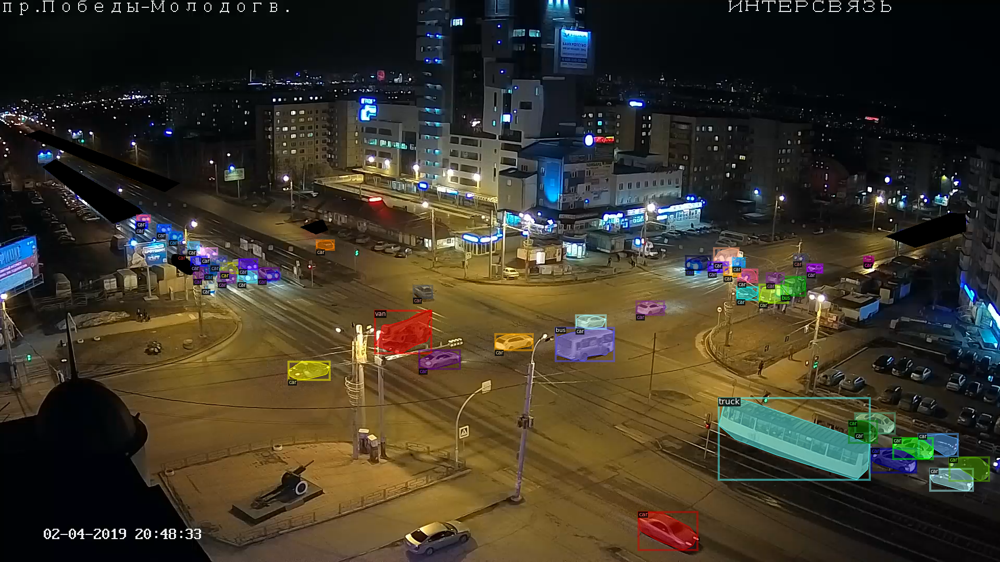

[[[ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]
  ...
  [ 8  3  0]
  [ 8  3  0]
  [ 8  3  0]]

 [[ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]
  ...
  [ 8  3  0]
  [ 8  3  0]
  [ 8  3  0]]

 [[ 7  7  7]
  [ 7  7  7]
  [ 6  6  6]
  ...
  [ 8  3  0]
  [ 8  3  0]
  [ 8  3  0]]

 ...

 [[ 3  1  0]
  [ 3  1  0]
  [ 3  1  0]
  ...
  [13 12 16]
  [13 12 16]
  [13 12 16]]

 [[ 3  1  0]
  [ 3  1  0]
  [ 3  1  0]
  ...
  [12 11 15]
  [13 12 16]
  [13 12 16]]

 [[ 3  1  0]
  [ 3  1  0]
  [ 3  1  0]
  ...
  [11 10 14]
  [13 12 16]
  [13 12 16]]]


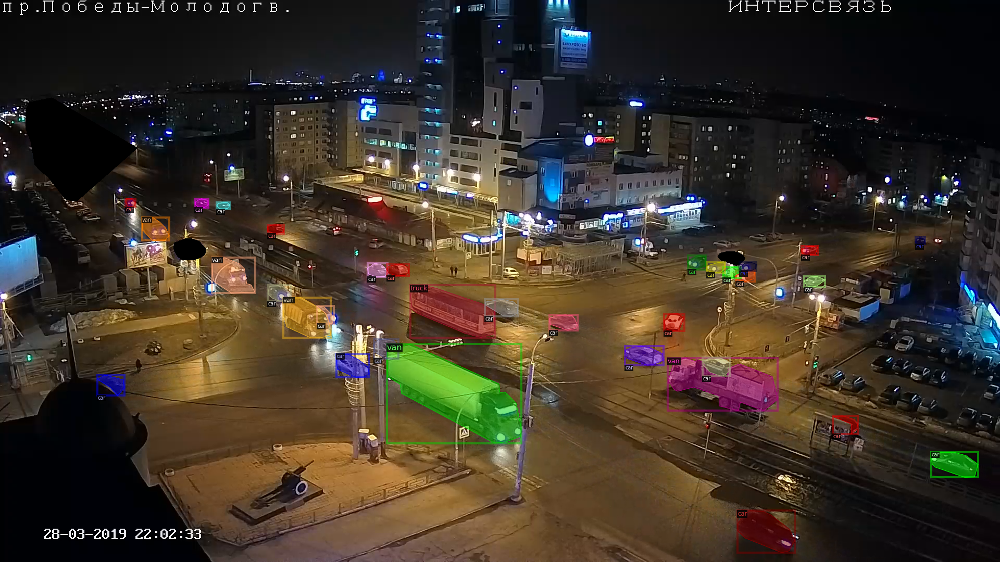

[[[212 194  64]
  [238 186  97]
  [238 187  95]
  ...
  [222 163  79]
  [222 163  79]
  [222 163  79]]

 [[238 186  97]
  [238 186  97]
  [238 187  95]
  ...
  [222 163  79]
  [222 163  79]
  [222 163  79]]

 [[238 188  89]
  [238 188  89]
  [238 188  92]
  ...
  [222 163  79]
  [222 163  79]
  [222 163  79]]

 ...

 [[ 74  75 151]
  [ 79  79 155]
  [102 102 178]
  ...
  [  3   5   5]
  [  5   7   7]
  [  7   9   9]]

 [[ 87  87 163]
  [102 102 178]
  [115 115 191]
  ...
  [  6   8   8]
  [  2   4   4]
  [  0   0   0]]

 [[ 92  92 168]
  [114 114 190]
  [125 125 202]
  ...
  [  9  11  11]
  [ 11  13  13]
  [ 13  15  15]]]


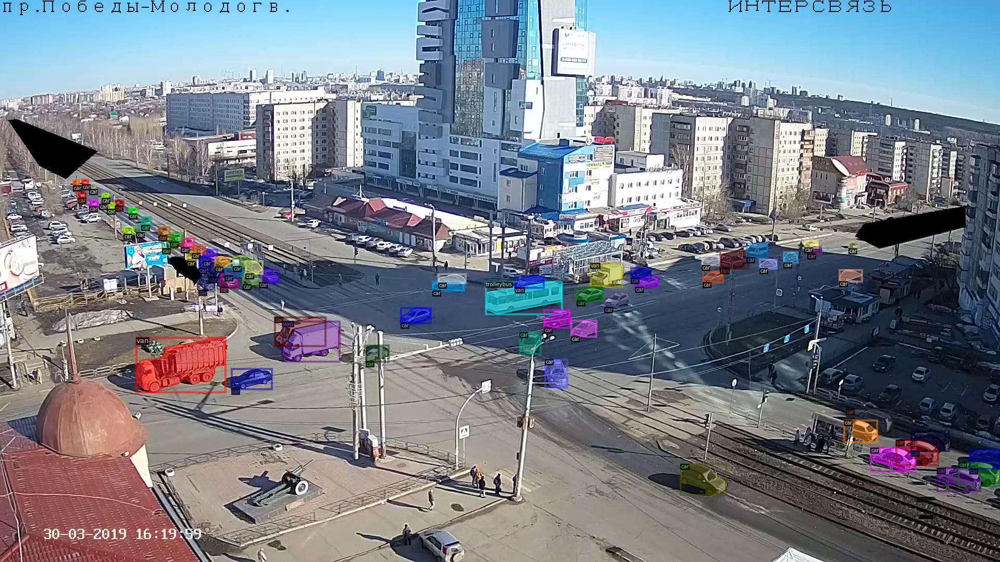

In [34]:
dataset = get_board_dicts(image_root)

#Randomly choosing 3 images from the Set
for d in random.sample(dataset, 3):
    img = cv2.imread(d["file_name"])
    print(img)
    visualizer = Visualizer(img[:, :, ::-1], metadata=board_metadata)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

In [6]:

def load_coco_json(json_file, image_root, dataset_name=None, extra_annotation_keys=None):  
    from pycocotools.coco import COCO

    timer = Timer()
    json_file = PathManager.get_local_path(json_file)
    with contextlib.redirect_stdout(io.StringIO()):
        coco_api = COCO(json_file)
    if timer.seconds() > 1:
        logger.info("Loading {} takes {:.2f} seconds.".format(json_file, timer.seconds()))

    id_map = None
    if dataset_name is not None:
        meta = MetadataCatalog.get(dataset_name)
        cat_ids = sorted(coco_api.getCatIds())
        cats = coco_api.loadCats(cat_ids)
        # The categories in a custom json file may not be sorted.
        thing_classes = [c["name"] for c in sorted(cats, key=lambda x: x["id"])]
        print(thing_classes)
        meta.thing_classes = thing_classes

        # In COCO, certain category ids are artificially removed,
        # and by convention they are always ignored.
        # We deal with COCO's id issue and translate
        # the category ids to contiguous ids in [0, 80).

        # It works by looking at the "categories" field in the json, therefore
        # if users' own json also have incontiguous ids, we'll
        # apply this mapping as well but print a warning.
        if not (min(cat_ids) == 1 and max(cat_ids) == len(cat_ids)):
            if "coco" not in dataset_name:
                logger.warning(
                    """
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.
"""
                )
        id_map = {v: i for i, v in enumerate(cat_ids)}
        meta.thing_dataset_id_to_contiguous_id = id_map

    # sort indices for reproducible results
    img_ids = sorted(coco_api.imgs.keys())
    # imgs is a list of dicts, each looks something like:
    # {'license': 4,
    #  'url': 'http://farm6.staticflickr.com/5454/9413846304_881d5e5c3b_z.jpg',
    #  'file_name': 'COCO_val2014_000000001268.jpg',
    #  'height': 427,
    #  'width': 640,
    #  'date_captured': '2013-11-17 05:57:24',
    #  'id': 1268}
    imgs = coco_api.loadImgs(img_ids)
    # anns is a list[list[dict]], where each dict is an annotation
    # record for an object. The inner list enumerates the objects in an image
    # and the outer list enumerates over images. Example of anns[0]:
    # [{'segmentation': [[192.81,
    #     247.09,
    #     ...
    #     219.03,
    #     249.06]],
    #   'area': 1035.749,
    #   'iscrowd': 0,
    #   'image_id': 1268,
    #   'bbox': [192.81, 224.8, 74.73, 33.43],
    #   'category_id': 16,
    #   'id': 42986},
    #  ...]
    anns = [coco_api.imgToAnns[img_id] for img_id in img_ids]
    total_num_valid_anns = sum([len(x) for x in anns])
    total_num_anns = len(coco_api.anns)
    if total_num_valid_anns < total_num_anns:
        logger.warning(
            f"{json_file} contains {total_num_anns} annotations, but only "
            f"{total_num_valid_anns} of them match to images in the file."
        )

    if "minival" not in json_file:
        # The popular valminusminival & minival annotations for COCO2014 contain this bug.
        # However the ratio of buggy annotations there is tiny and does not affect accuracy.
        # Therefore we explicitly white-list them.
        ann_ids = [ann["id"] for anns_per_image in anns for ann in anns_per_image]
        assert len(set(ann_ids)) == len(ann_ids), "Annotation ids in '{}' are not unique!".format(
            json_file
        )

    imgs_anns = list(zip(imgs, anns))
    logger.info("Loaded {} images in COCO format from {}".format(len(imgs_anns), json_file))

    dataset_dicts = []

    ann_keys = ["iscrowd", "bbox", "keypoints", "category_id"] + (extra_annotation_keys or [])

    num_instances_without_valid_segmentation = 0

    for (img_dict, anno_dict_list) in imgs_anns:
        record = {}
        record["file_name"] = os.path.join(image_root, img_dict["file_name"])
        record["height"] = img_dict["height"]
        record["width"] = img_dict["width"]
        image_id = record["image_id"] = img_dict["id"]

        objs = []
        for anno in anno_dict_list:
            # Check that the image_id in this annotation is the same as
            # the image_id we're looking at.
            # This fails only when the data parsing logic or the annotation file is buggy.

            # The original COCO valminusminival2014 & minival2014 annotation files
            # actually contains bugs that, together with certain ways of using COCO API,
            # can trigger this assertion.
            assert anno["image_id"] == image_id

            assert anno.get("ignore", 0) == 0, '"ignore" in COCO json file is not supported.'

            obj = {key: anno[key] for key in ann_keys if key in anno}
            if "bbox" in obj and len(obj["bbox"]) == 0:
                raise ValueError(
                    f"One annotation of image {image_id} contains empty 'bbox' value! "
                    "This json does not have valid COCO format."
                )

            segm = anno.get("segmentation", None)
            if segm:  # either list[list[float]] or dict(RLE)
                if isinstance(segm, dict):
                    if isinstance(segm["counts"], list):
                        # convert to compressed RLE
                        segm = mask_util.frPyObjects(segm, *segm["size"])
                else:
                    # filter out invalid polygons (< 3 points)
                    segm = [poly for poly in segm if len(poly) % 2 == 0 and len(poly) >= 6]
                    if len(segm) == 0:
                        num_instances_without_valid_segmentation += 1
                        continue  # ignore this instance
                obj["segmentation"] = segm

            keypts = anno.get("keypoints", None)
            if keypts:  # list[int]
                for idx, v in enumerate(keypts):
                    if idx % 3 != 2:
                        # COCO's segmentation coordinates are floating points in [0, H or W],
                        # but keypoint coordinates are integers in [0, H-1 or W-1]
                        # Therefore we assume the coordinates are "pixel indices" and
                        # add 0.5 to convert to floating point coordinates.
                        keypts[idx] = v + 0.5
                obj["keypoints"] = keypts

            obj["bbox_mode"] = BoxMode.XYWH_ABS
            if id_map:
                annotation_category_id = obj["category_id"]
                try:
                    obj["category_id"] = id_map[annotation_category_id]
                except KeyError as e:
                    raise KeyError(
                        f"Encountered category_id={annotation_category_id} "
                        "but this id does not exist in 'categories' of the json file."
                    ) from e
            objs.append(obj)
        record["annotations"] = objs
        dataset_dicts.append(record)

    if num_instances_without_valid_segmentation > 0:
        logger.warning(
            "Filtered out {} instances without valid segmentation. ".format(
                num_instances_without_valid_segmentation
            )
            + "There might be issues in your dataset generation process.  Please "
            "check https://detectron2.readthedocs.io/en/latest/tutorials/datasets.html carefully"
        )
    return dataset_dicts


In [7]:
json_file = "drive/MyDrive/Traffic-flow-estimation-data/train/dataset.json"
image_root = "drive/MyDrive/Traffic-flow-estimation-data/train"
logger = logging.getLogger(__name__)

__all__ = ["load_coco_json", "load_sem_seg", "convert_to_coco_json", "register_coco_instances"]

dataset_dicts = load_coco_json(json_file, image_root)
# dataset_dicts

In [26]:
from detectron2.engine import DefaultTrainer
from detectron2.evaluation import COCOEvaluator

class CocoTrainer(DefaultTrainer):
  # CUDA_LAUNCH_BLOCKING=1

  @classmethod
  def build_evaluator(cls, cfg, dataset_name, output_folder=None):

    if output_folder is None:
        os.makedirs("coco_eval", exist_ok=True)
        output_folder = "coco_eval"

    return COCOEvaluator(dataset_name, cfg, False, output_folder)

In [35]:
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
import os
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml")) #Get the basic model configuration from the model zoo 
#Passing the Train and Validation sets
cfg.DATASETS.TRAIN = ("boardetect_train",)
cfg.DATASETS.TEST = ("boardetect_val",)
# Number of data loading threads
cfg.DATALOADER.NUM_WORKERS = 4
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
# Number of images per batch across all machines.
cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR = 0.0125  # pick a good LearningRate
cfg.SOLVER.MAX_ITER = 1500  #No. of iterations   
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 256  
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 6 # No. of classes = [HINDI, ENGLISH, OTHER]
cfg.TEST.EVAL_PERIOD = 500 # No. of iterations after which the Validation Set is evaluated. 
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
# CUDA_LAUNCH_BLOCKING=1
trainer = CocoTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[05/16 23:20:38 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:490: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))
Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (7, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (7,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in th

[05/16 23:20:39 d2.engine.train_loop]: Starting training from iteration 0
[05/16 23:20:54 d2.utils.events]:  eta: 0:17:25  iter: 19  total_loss: 2.774  loss_cls: 1.699  loss_box_reg: 0.5316  loss_rpn_cls: 0.2166  loss_rpn_loc: 0.3372  time: 0.7071  data_time: 0.0814  lr: 0.00024976  max_mem: 5737M
[05/16 23:21:08 d2.utils.events]:  eta: 0:17:02  iter: 39  total_loss: 1.665  loss_cls: 0.6686  loss_box_reg: 0.5287  loss_rpn_cls: 0.1521  loss_rpn_loc: 0.2868  time: 0.6966  data_time: 0.0207  lr: 0.00049951  max_mem: 5737M
[05/16 23:21:22 d2.utils.events]:  eta: 0:16:51  iter: 59  total_loss: 1.561  loss_cls: 0.5505  loss_box_reg: 0.6494  loss_rpn_cls: 0.09759  loss_rpn_loc: 0.2716  time: 0.6984  data_time: 0.0230  lr: 0.00074926  max_mem: 5737M
[05/16 23:21:36 d2.utils.events]:  eta: 0:16:38  iter: 79  total_loss: 1.436  loss_cls: 0.4498  loss_box_reg: 0.6188  loss_rpn_cls: 0.08568  loss_rpn_loc: 0.2686  time: 0.6969  data_time: 0.0242  lr: 0.00099901  max_mem: 5737M
[05/16 23:21:50 d2.ut

In [40]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

[05/16 23:46:20 d2.checkpoint.c2_model_loading]: Following weights matched with model:
| Names in Model                                  | Names in Checkpoint                                                                                  | Shapes                                          |
|:------------------------------------------------|:-----------------------------------------------------------------------------------------------------|:------------------------------------------------|
| backbone.bottom_up.res2.0.conv1.*               | backbone.bottom_up.res2.0.conv1.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}    | (64,) (64,) (64,) (64,) (64,64,1,1)             |
| backbone.bottom_up.res2.0.conv2.*               | backbone.bottom_up.res2.0.conv2.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}    | (64,) (64,) (64,) (64,) (64,64,3,3)             |
| backbone.bottom_up.res2.0.conv3.*               | backbone.bottom_up.res2.0.conv3.{norm.bia

In [41]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("boardetect_val", cfg, False, output_dir="/output/")
val_loader = build_detection_test_loader(cfg, "boardetect_val")
inference_on_dataset(predictor.model, val_loader, evaluator)
# another equivalent way is to use trainer.test

WARNING [05/16 23:46:21 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
[05/16 23:46:21 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[05/16 23:46:21 d2.data.common]: Serializing 786 elements to byte tensors and concatenating them all ...
[05/16 23:46:21 d2.data.common]: Serialized dataset takes 11.92 MiB
[05/16 23:46:21 d2.evaluation.evaluator]: Start inference on 786 batches


/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:490: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


[05/16 23:46:24 d2.evaluation.evaluator]: Inference done 11/786. Dataloading: 0.0202 s/iter. Inference: 0.1092 s/iter. Eval: 0.0020 s/iter. Total: 0.1314 s/iter. ETA=0:01:41
[05/16 23:46:29 d2.evaluation.evaluator]: Inference done 48/786. Dataloading: 0.0243 s/iter. Inference: 0.1102 s/iter. Eval: 0.0007 s/iter. Total: 0.1356 s/iter. ETA=0:01:40
[05/16 23:46:34 d2.evaluation.evaluator]: Inference done 86/786. Dataloading: 0.0215 s/iter. Inference: 0.1115 s/iter. Eval: 0.0005 s/iter. Total: 0.1339 s/iter. ETA=0:01:33
[05/16 23:46:39 d2.evaluation.evaluator]: Inference done 120/786. Dataloading: 0.0234 s/iter. Inference: 0.1138 s/iter. Eval: 0.0006 s/iter. Total: 0.1381 s/iter. ETA=0:01:31
[05/16 23:46:44 d2.evaluation.evaluator]: Inference done 154/786. Dataloading: 0.0203 s/iter. Inference: 0.1193 s/iter. Eval: 0.0007 s/iter. Total: 0.1407 s/iter. ETA=0:01:28
[05/16 23:46:49 d2.evaluation.evaluator]: Inference done 191/786. Dataloading: 0.0209 s/iter. Inference: 0.1178 s/iter. Eval: 0.

OrderedDict([('bbox',
              {'AP': 48.758269893918246,
               'AP-bus': 33.868096561174795,
               'AP-car': 44.8783913443399,
               'AP-tram': nan,
               'AP-trolleybus': 47.558732215957136,
               'AP-truck': 76.22043132342654,
               'AP-van': 41.265698024692824,
               'AP50': 67.40199637064201,
               'AP75': 57.91405082231665,
               'APl': 67.69294259268132,
               'APm': 56.15238025162634,
               'APs': 22.1558648573998})])

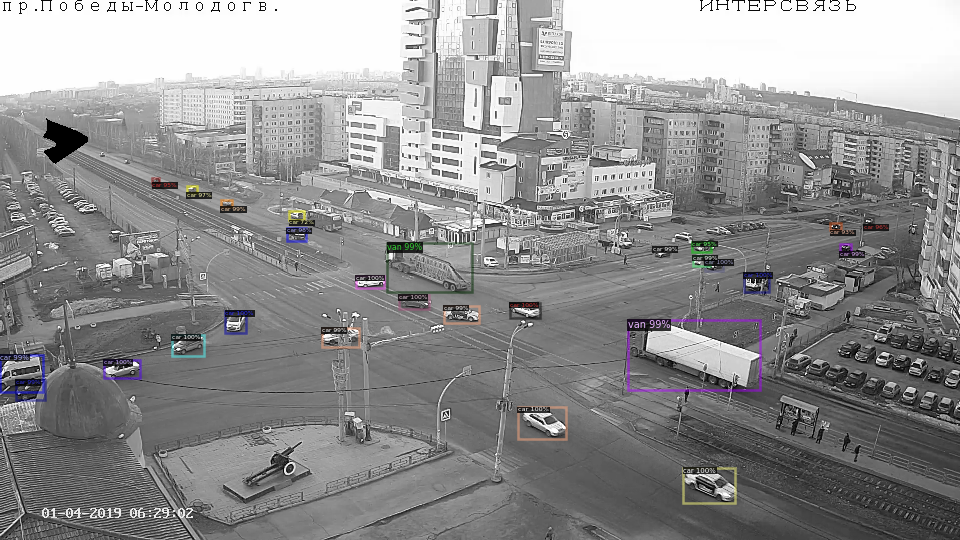

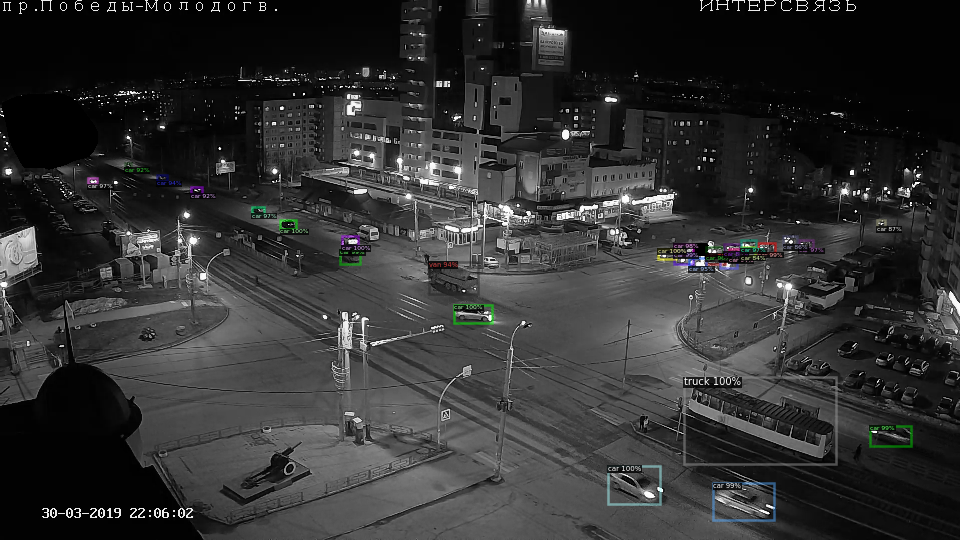

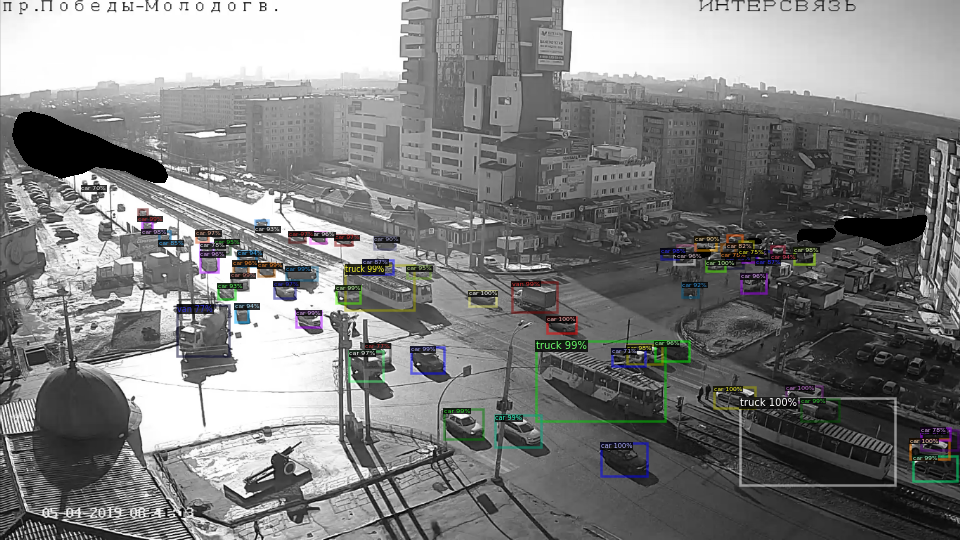

In [44]:
from detectron2.utils.visualizer import ColorMode
dataset_dicts = get_board_dicts("drive/MyDrive/Traffic-flow-estimation-data/train")
for d in random.sample(dataset_dicts, 3):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    v = Visualizer(im[:, :, ::-1],
                   metadata=board_metadata, 
                   scale=0.5, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])